## Imports and Setup

In [ ]:
!pip install --index-url https://test.pypi.org/simple/ --extra-index-url https://pypi.org/simple/ dfcv-colocation-mapping==0.2.2

In [ ]:
!apt install gdal-bin

In [3]:
import warnings
warnings.filterwarnings(action="ignore", message=r"datetime.datetime.utcnow")

from dfcv_colocation_mapping import data_download
from dfcv_colocation_mapping import data_utils
from dfcv_colocation_mapping import map_utils

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

## Parameters

In [4]:
iso_code = "RWA"
adm_level = "ADM3"
acled_start_date = "2021-01-01" 
acled_key = #INSERT ACLED KEY HERE
acled_email = #INSERT ACLED EMAIL HERE

## Download Datasets

In [6]:
dm = data_download.DatasetManager(
    iso_code, 
    adm_level=adm_level,
    acled_key=acled_key,
    acled_email=acled_email,
    acled_start_date=acled_start_date
)
geoplot = map_utils.GeoPlot(dm)
dm.data.sort_values("mhs_wbg_conflict_exposure_relative", ascending=False).head(2)

INFO:root:Loading geoboundary...
INFO:root:Loading hazard layers...
INFO:root:Loading conflict data...
INFO:root:Calculating scores...


,iso_code,ADM3,ADM3_ID,ADM2_ID,ADM2,ADM1_ID,ADM1,worldpop,earthquake,earthquake_exposure,earthquake_intensity_weighted_exposure,landslide,landslide_exposure,landslide_intensity_weighted_exposure,cyclone,cyclone_exposure,cyclone_intensity_weighted_exposure,geometry,population_best,conflict_count,null_conflict_count,acled_conflict_exposure,wbg_conflict_exposure,earthquake_exposure_relative,earthquake_intensity_weighted_exposure_relative,landslide_exposure_relative,landslide_intensity_weighted_exposure_relative,cyclone_exposure_relative,cyclone_intensity_weighted_exposure_relative,acled_conflict_exposure_relative,wbg_conflict_exposure_relative,mhs_exposure_relative,mhs_wbg_conflict_exposure_relative,mhs_intensity_weighted_exposure_relative
88,RWA,Gasaka,94199721B41646297917128,40016504B8024501353651,Nyamagabe,46589978B41058743603332,Southern Province,60269.378906,0.218661,60269.378906,50256.757812,3.125000,52052.335938,43517.867188,0.009346,0.0,0.0,"POLYGON ((29.61571 -2.47051, 29.61553 -2.47049...",6541.0,1.0,NaN,6541.0,58391.320312,1.0,0.833869,0.863661,0.722056,0.0,0.0,0.108529,0.968839,0.930582,0.901574,0.827411
149,RWA,Boneza,94199721B17778384836964,40016504B58353894398581,Rutsiro,46589978B43518966718904,Western Province,30204.626953,0.221912,30204.626953,24819.308594,3.255319,25640.988281,22178.433594,0.003107,0.0,0.0,"MULTIPOLYGON (((29.15245 -1.91992, 29.15235 -1...",12438.0,1.0,NaN,12438.0,29258.589844,1.0,0.821706,0.848909,0.734273,0.0,0.0,0.411791,0.968679,0.922909,0.893992,0.827856


## AHP Weight Calculation [Optional]

In [6]:
dm.calculate_ahp()
geoplot = map_utils.GeoPlot(dm)
dm.data.sort_values("mhs_wbg_conflict_exposure_relative", ascending=False).head(3)

How much more important is earthquake compared to landslide:  1
How much more important is earthquake compared to cyclone:  1
How much more important is earthquake compared to pluvial_defended:  1
How much more important is earthquake compared to fluvial_defended:  1
How much more important is earthquake compared to coastal_defended:  1
How much more important is landslide compared to cyclone:  1
How much more important is landslide compared to pluvial_defended:  1
How much more important is landslide compared to fluvial_defended:  1
How much more important is landslide compared to coastal_defended:  1
How much more important is cyclone compared to pluvial_defended:  1
How much more important is cyclone compared to fluvial_defended:  1
How much more important is cyclone compared to coastal_defended:  1
How much more important is pluvial_defended compared to fluvial_defended:  1
How much more important is pluvial_defended compared to coastal_defended:  1
How much more important is fluvi

INFO:root:Consistency_ratio: 0.0
INFO:root:{'earthquake': 0.16667, 'landslide': 0.16667, 'cyclone': 0.16667, 'pluvial_defended': 0.16667, 'fluvial_defended': 0.16667, 'coastal_defended': 0.16667}


,iso_code,ADM3,ADM3_ID,ADM2_ID,ADM2,ADM1_ID,ADM1,worldpop,earthquake,earthquake_exposure,earthquake_intensity_weighted_exposure,landslide,landslide_exposure,landslide_intensity_weighted_exposure,cyclone,cyclone_exposure,cyclone_intensity_weighted_exposure,geometry,population_best,conflict_count,null_conflict_count,acled_conflict_exposure,wbg_conflict_exposure,earthquake_exposure_relative,earthquake_intensity_weighted_exposure_relative,landslide_exposure_relative,landslide_intensity_weighted_exposure_relative,cyclone_exposure_relative,cyclone_intensity_weighted_exposure_relative,acled_conflict_exposure_relative,wbg_conflict_exposure_relative,mhs_exposure_relative,mhs_wbg_conflict_exposure_relative,mhs_intensity_weighted_exposure_relative
88,RWA,Gasaka,94199721B41646297917128,40016504B8024501353651,Nyamagabe,46589978B41058743603332,Southern Province,60269.378906,0.218661,60269.378906,50256.757812,3.125000,52052.335938,43517.867188,0.009346,0.0,0.0,"POLYGON ((29.61571 -2.47051, 29.61553 -2.47049...",6541.0,1.0,NaN,6541.0,58391.320312,1.0,0.833869,0.863661,0.722056,0.0,0.0,0.108529,0.968839,0.930582,0.901574,0.827411
149,RWA,Boneza,94199721B17778384836964,40016504B58353894398581,Rutsiro,46589978B43518966718904,Western Province,30204.626953,0.221912,30204.626953,24819.308594,3.255319,25640.988281,22178.433594,0.003107,0.0,0.0,"MULTIPOLYGON (((29.15245 -1.91992, 29.15235 -1...",12438.0,1.0,NaN,12438.0,29258.589844,1.0,0.821706,0.848909,0.734273,0.0,0.0,0.411791,0.968679,0.922909,0.893992,0.827856
173,RWA,Rugerero,94199721B25246697837793,40016504B41870686260998,Rubavu,46589978B43518966718904,Western Province,71924.945312,0.208847,71924.945312,57371.257812,2.791667,47125.546875,42090.910156,0.001947,0.0,0.0,"POLYGON ((29.27015 -1.71473, 29.27041 -1.71484...",133286.0,11.0,6.0,26657.2,71924.945312,1.0,0.797655,0.655204,0.585206,0.0,0.0,0.370625,1.000000,0.818525,0.818525,0.731960


# Publication-ready Maps

## Plot Regional Groupings

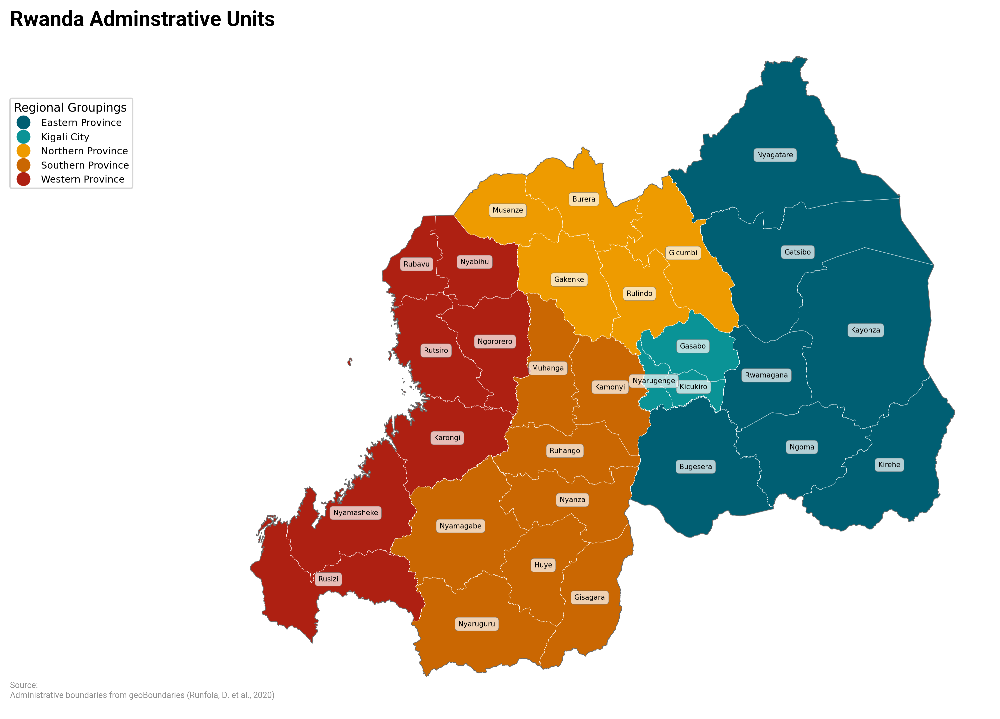

In [13]:
geoplot.plot_geoboundaries(
    adm_level="ADM2", 
    group="ADM1"
);

## Plot Population

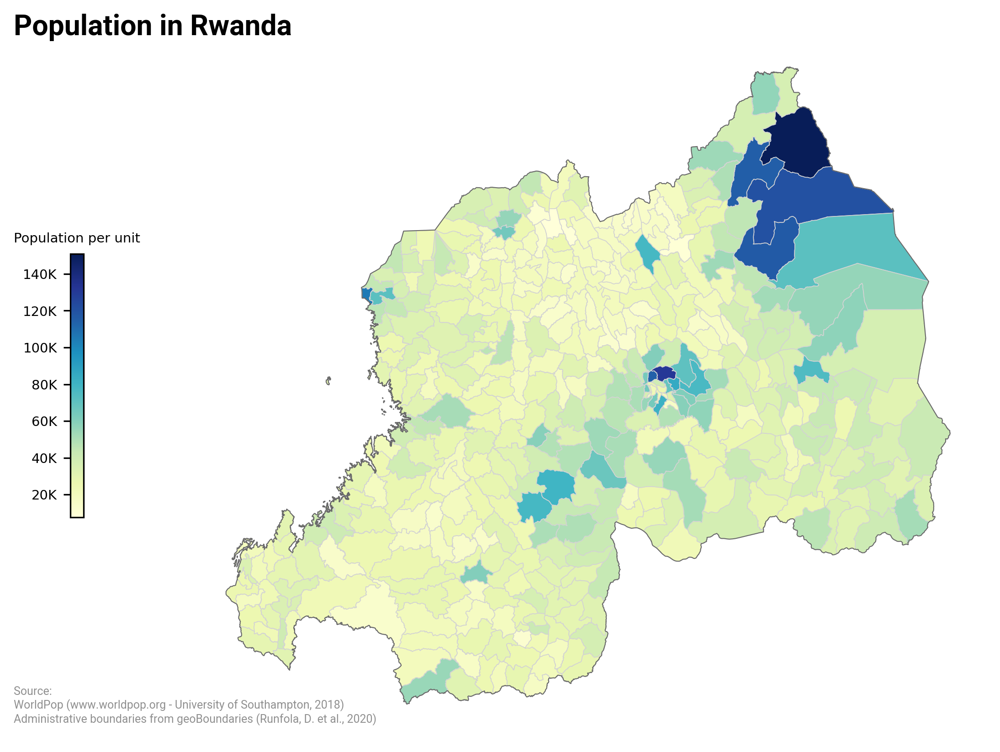

In [8]:
ax = geoplot.plot_choropleth( 
    var="worldpop",
    kwargs={"legend_type": "colorbar"}
)

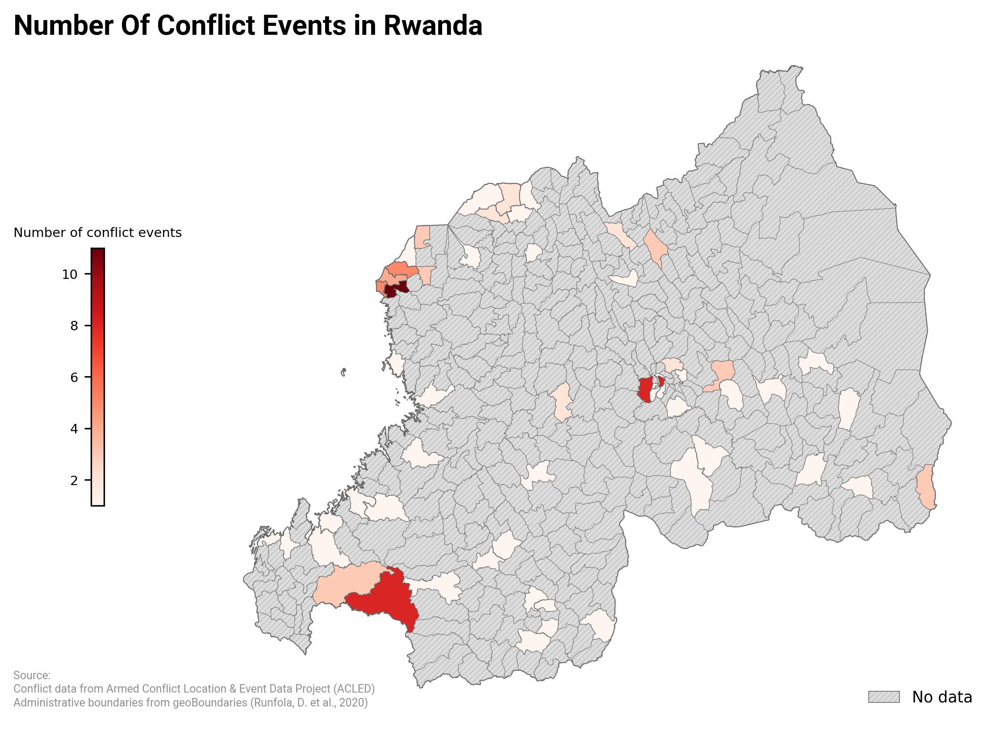

In [9]:
geoplot.plot_choropleth( 
    var="conflict_count",
    kwargs={
        "legend_type": "colorbar",
        "palette_name": "Reds",
        "edgecolor": "dimgray"
    }
);

## Plot Conflict Exposure - ACLED

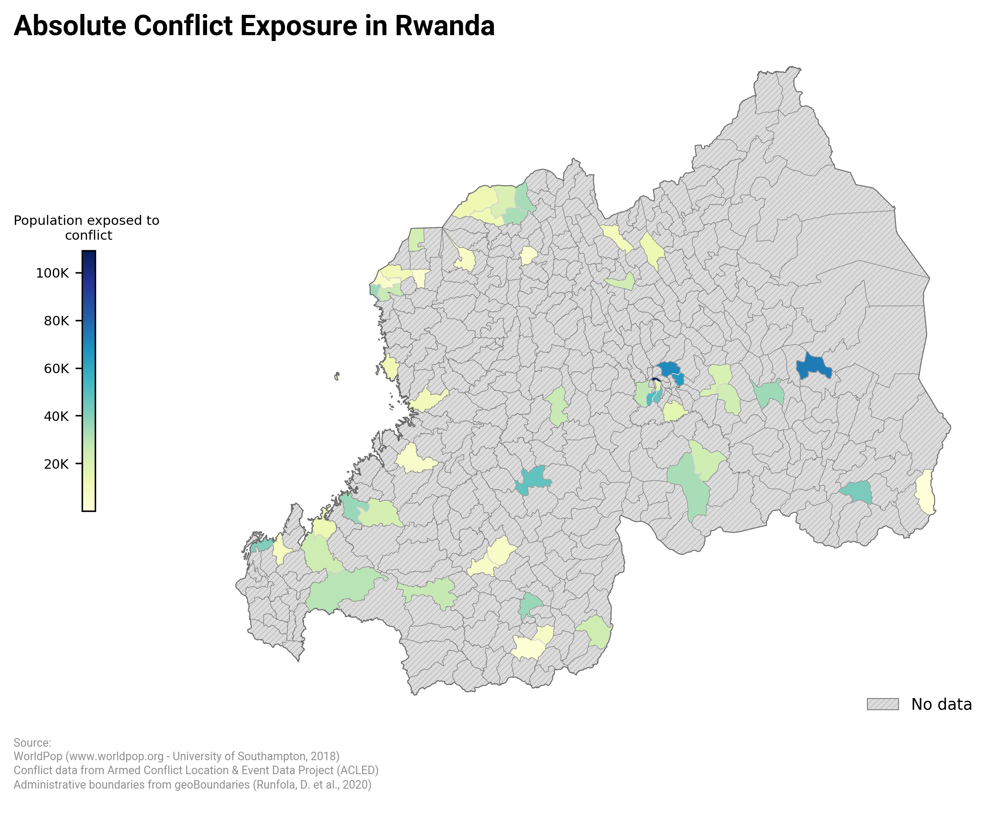

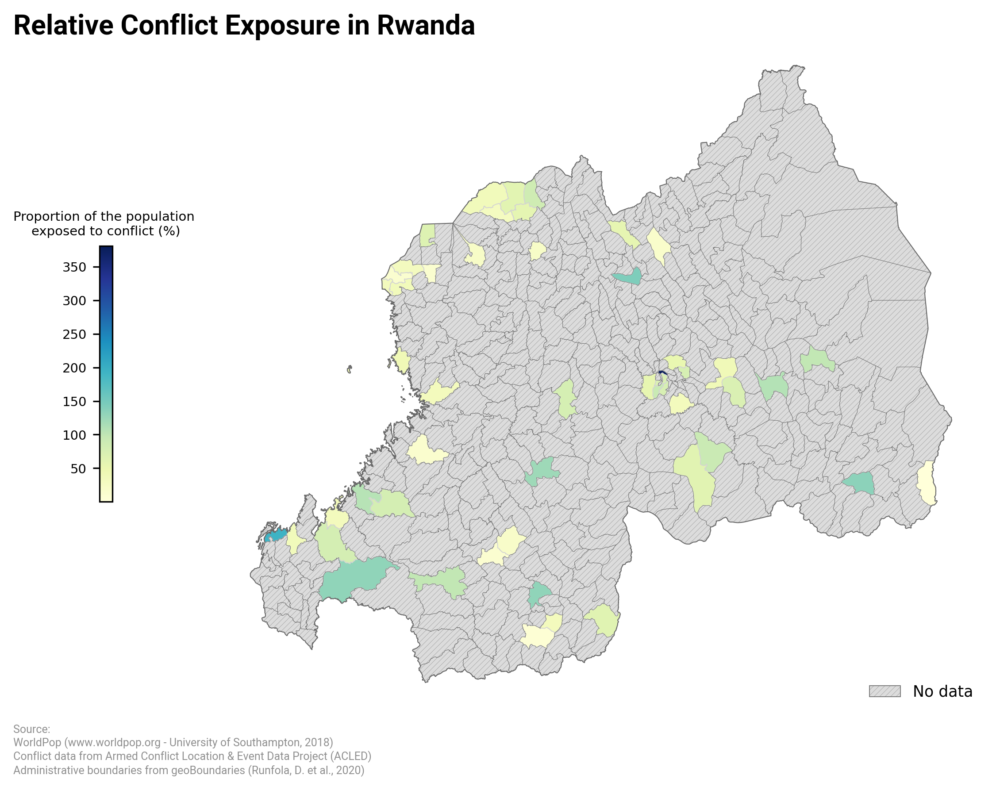

In [9]:
source = "acled"
geoplot.plot_choropleth( 
    var=f"{source}_conflict_exposure",
    kwargs={"legend_type": "colorbar"}
)
geoplot.plot_choropleth( 
    var=f"{source}_conflict_exposure_relative",
    kwargs={"legend_type": "colorbar"}
);

## Plot Conflict Exposure - World Bank

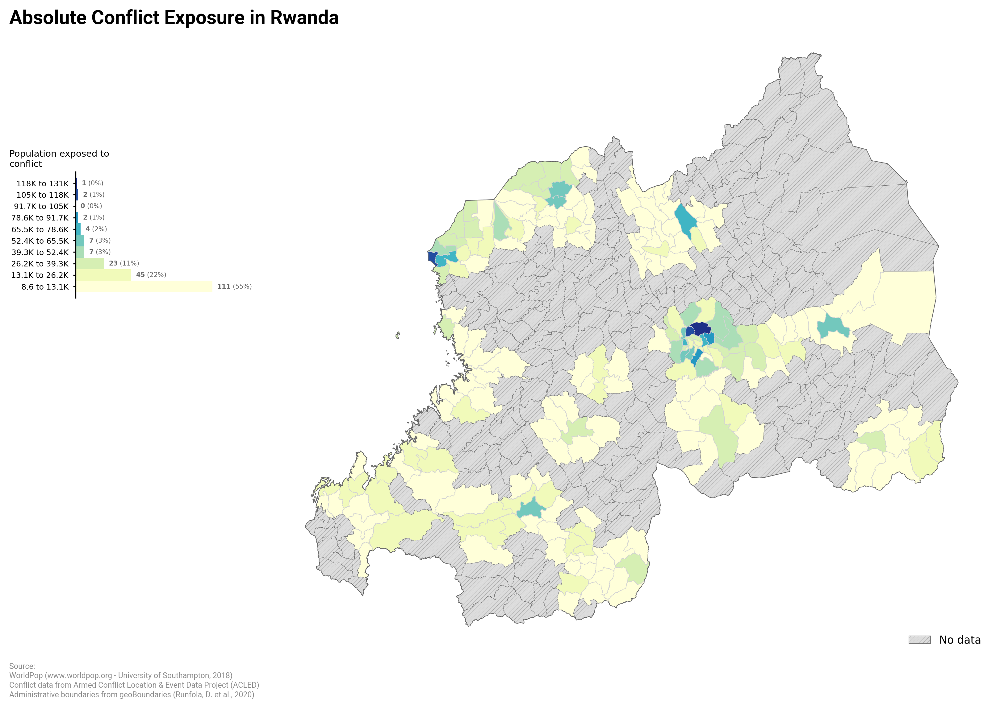

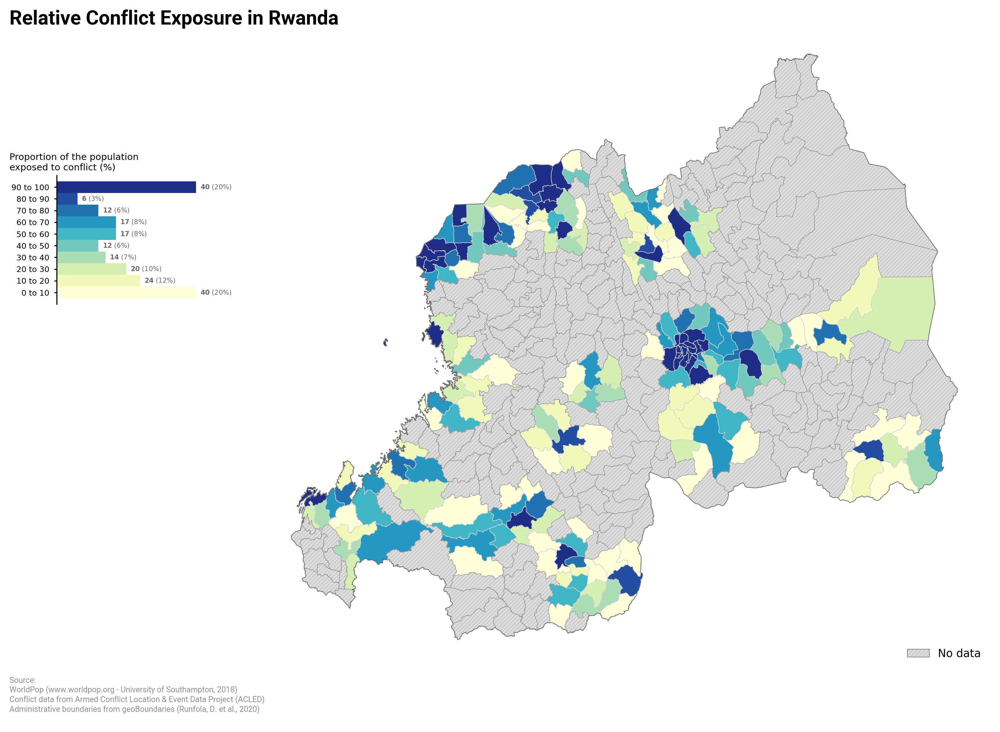

In [10]:
source = "wbg"
geoplot.plot_choropleth( 
    var=f"{source}_conflict_exposure",
)
geoplot.plot_choropleth( 
    var=f"{source}_conflict_exposure_relative",
    var_bounds=[0, 100],
);

## Zoom Choropleth to a specific region

<Axes: >

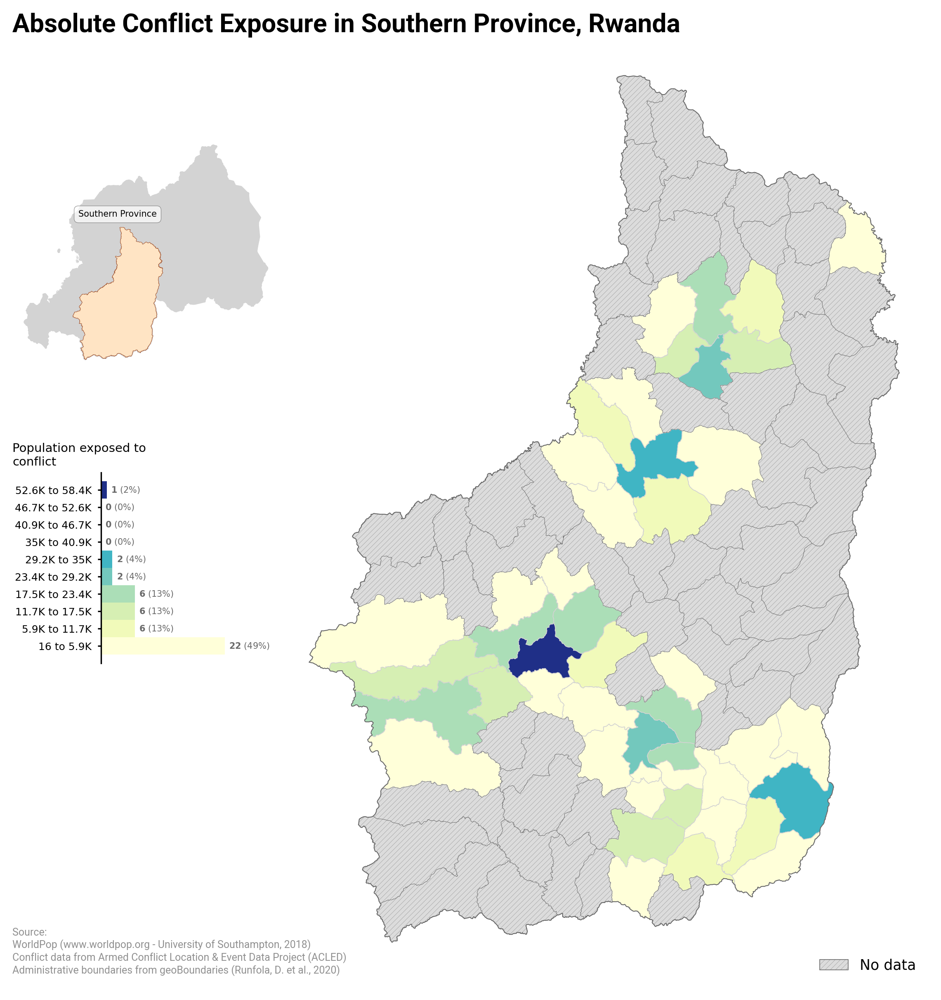

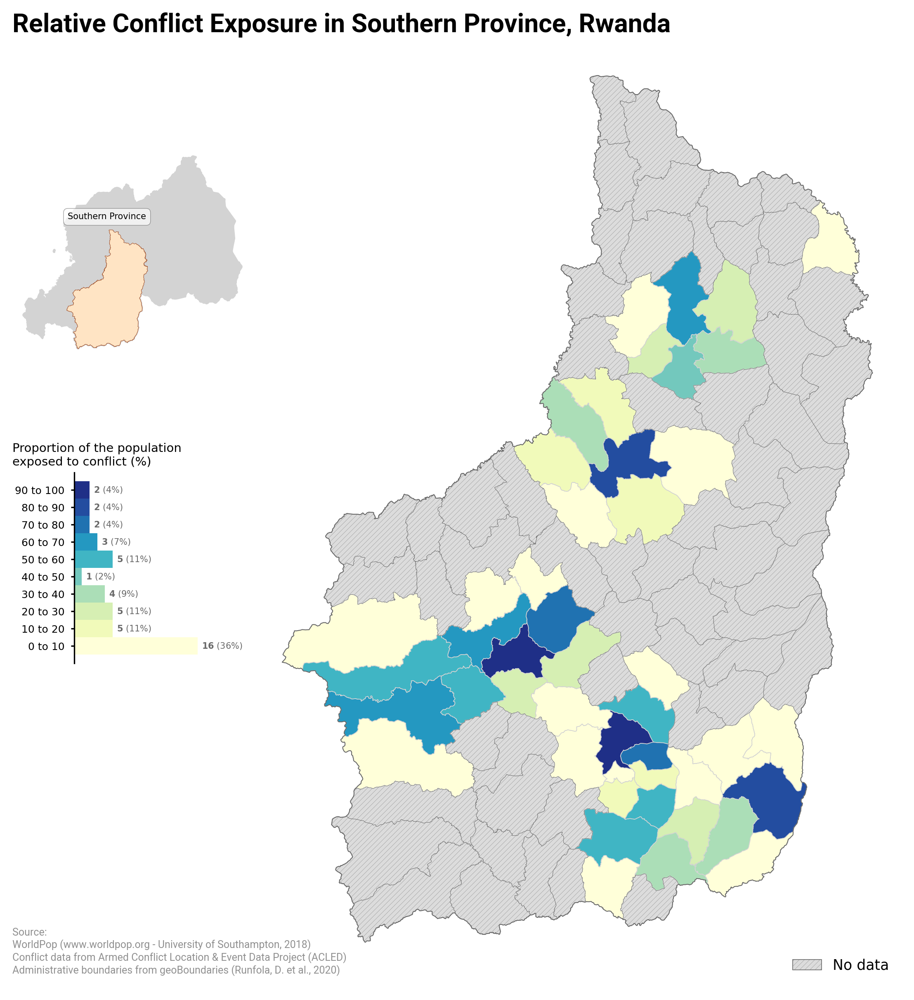

In [16]:
source = "wbg"
geoplot.plot_choropleth( 
    var=f"{source}_conflict_exposure",
    zoom_to={"ADM1": "Southern Province"},
)
geoplot.plot_choropleth( 
    var=f"{source}_conflict_exposure_relative",
    zoom_to={"ADM1": "Southern Province"},
    var_bounds=[0, 100]
);

## Map Exposure to a Single Hazard

C:\Users\Isabelle\Documents\GFDRR\dfcv\colocation-mapping\src\dfcv_colocation_mapping\map_utils.py:181: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), fontsize=config["cbar_fontsize"])


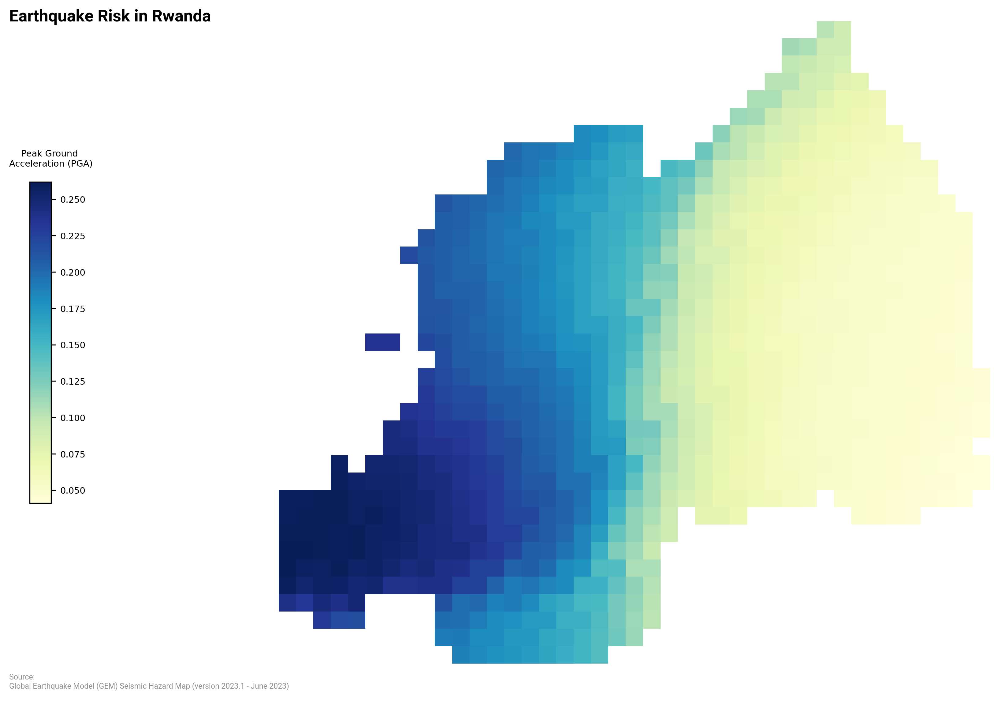

In [8]:
hazard = "earthquake"
geoplot.plot_raster(hazard);

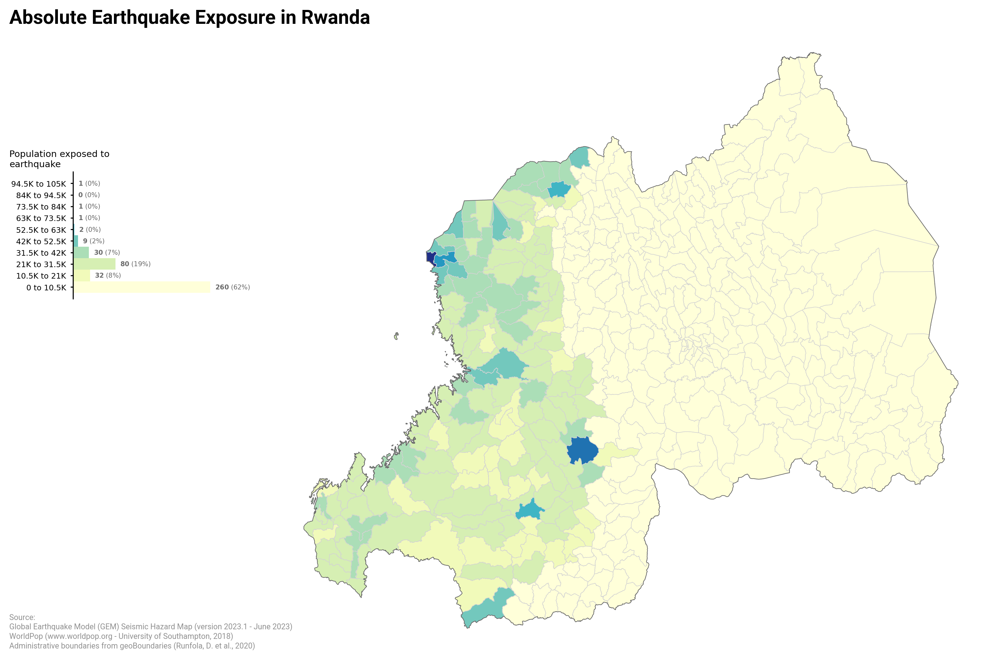

In [18]:
geoplot.plot_choropleth(f"{hazard}_exposure");

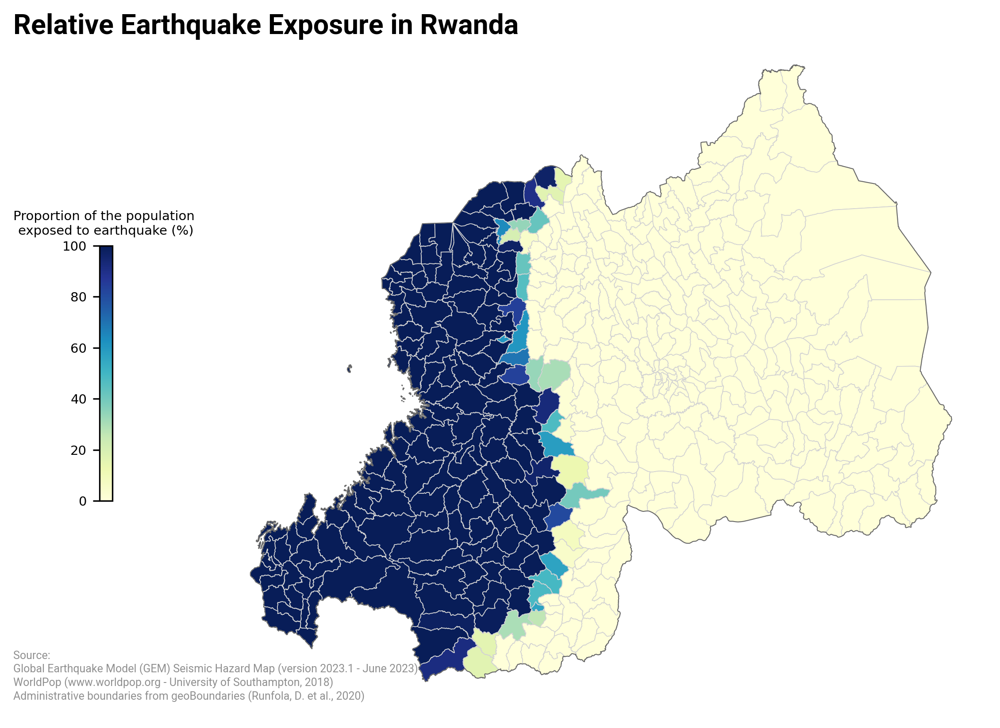

In [19]:
geoplot.plot_choropleth(
    f"{hazard}_exposure_relative",
    kwargs={
        "legend_type": "colorbar",
    }
);

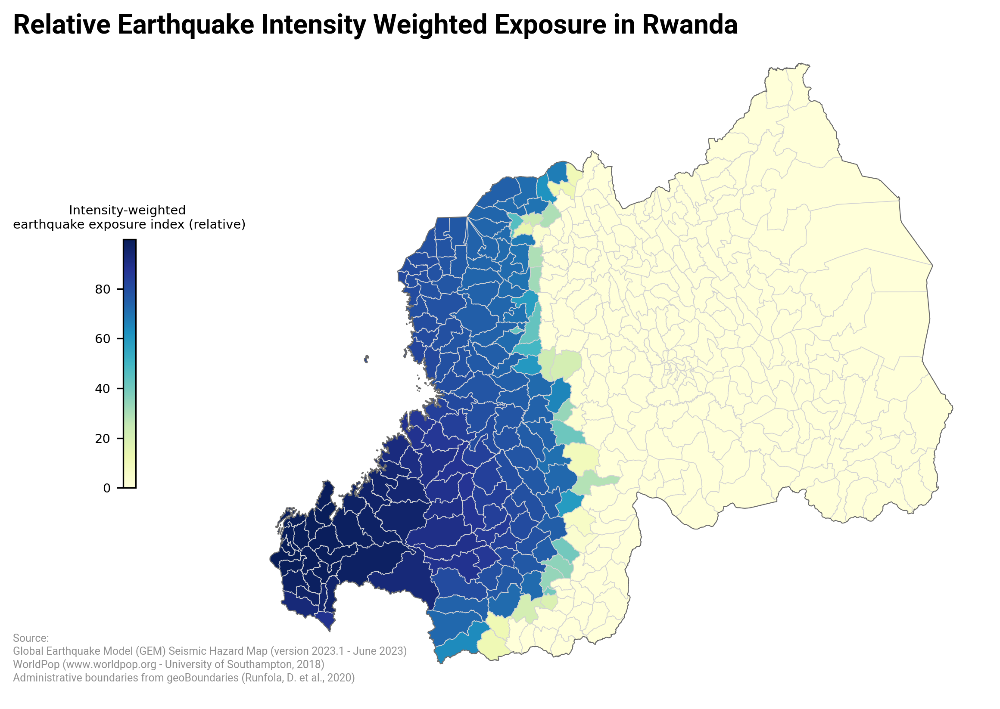

In [20]:
geoplot.plot_choropleth(
    f"{hazard}_intensity_weighted_exposure_relative",
    kwargs={
        "legend_type": "colorbar",
    }
);

## Plot Multi-hazard Exposure Index and Multi-hazard Conflict Exposure Index

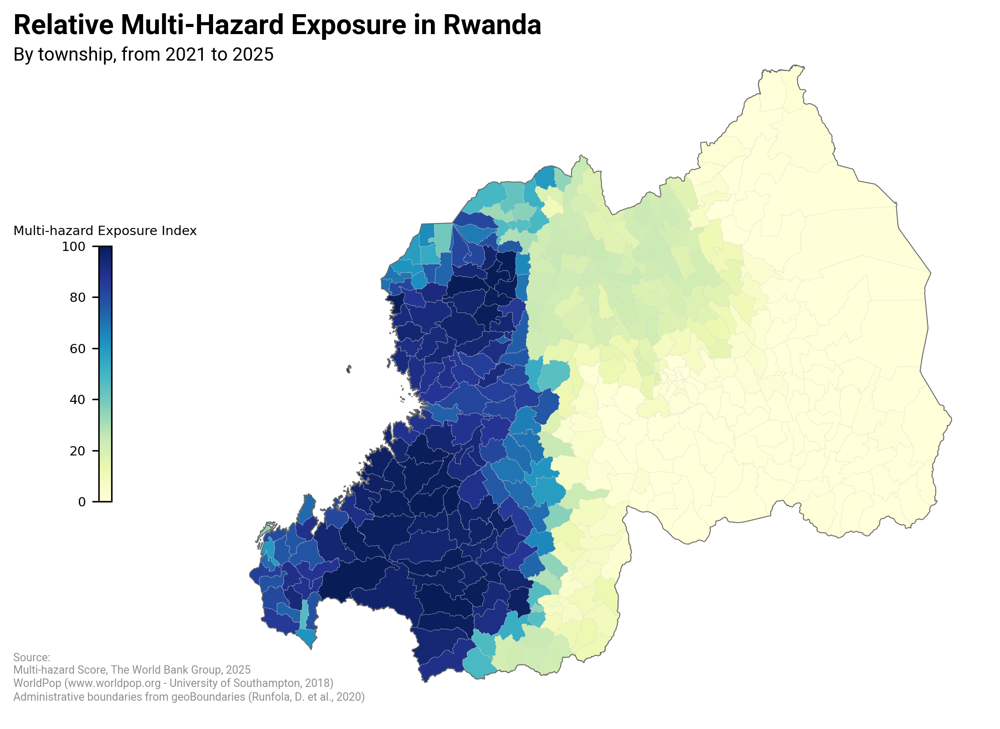

In [21]:
geoplot.plot_choropleth( 
    var="mhs_exposure_relative",
    subtitle="By township, from 2021 to 2025",
    kwargs={
        "legend_type": "colorbar", 
        "linewidth": 0.1
    }
);

In [ ]:
geoplot.plot_choropleth( 
    var="mhs_intensity_weighted_exposure_relative",
    kwargs={
        "legend_type": "colorbar", 
        "linewidth": 0.1
    }
);

In [ ]:
geoplot.plot_choropleth( 
    var="mhs_wbg_conflict_exposure_relative",
    kwargs={"legend_type": "colorbar"}
);

# Bivariate Choropleth: Overlay Multi-hazard and Conflict Exposure

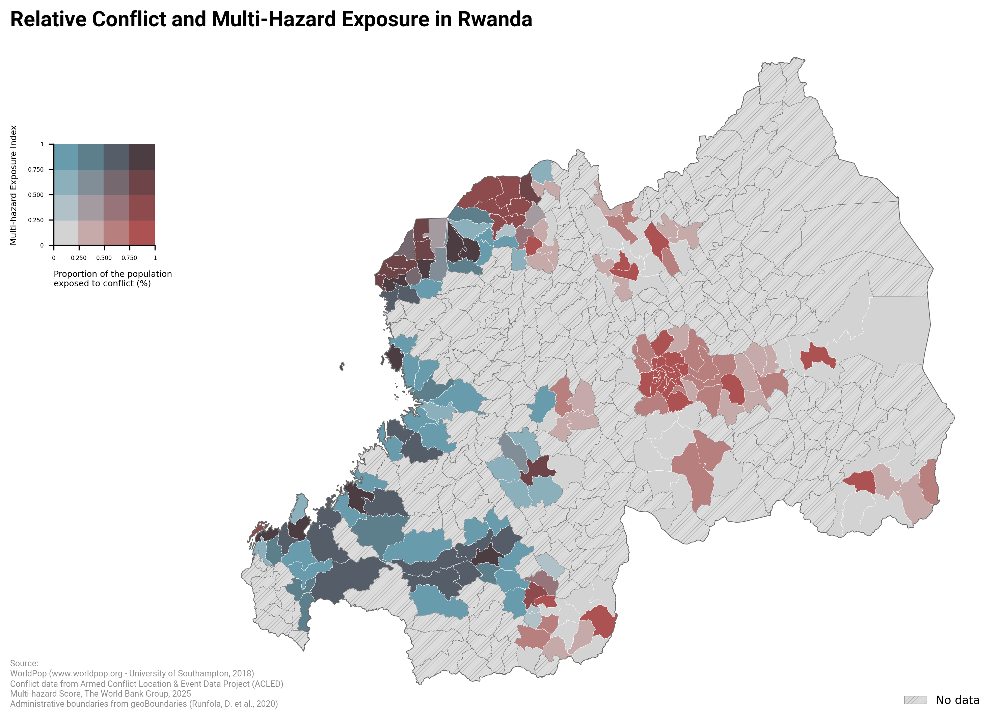

In [24]:
geoplot.plot_bivariate_choropleth( 
    var1="wbg_conflict_exposure_relative",
    var2="mhs_exposure_relative",
    var1_bounds=[0, 1],
    var2_bounds=[0, 1],
    binning="equal_intervals",
    kwargs={
        "legend_fontsize": 4, 
        "edgecolor": "white", 
        "linewidth": 0.2
    }
);

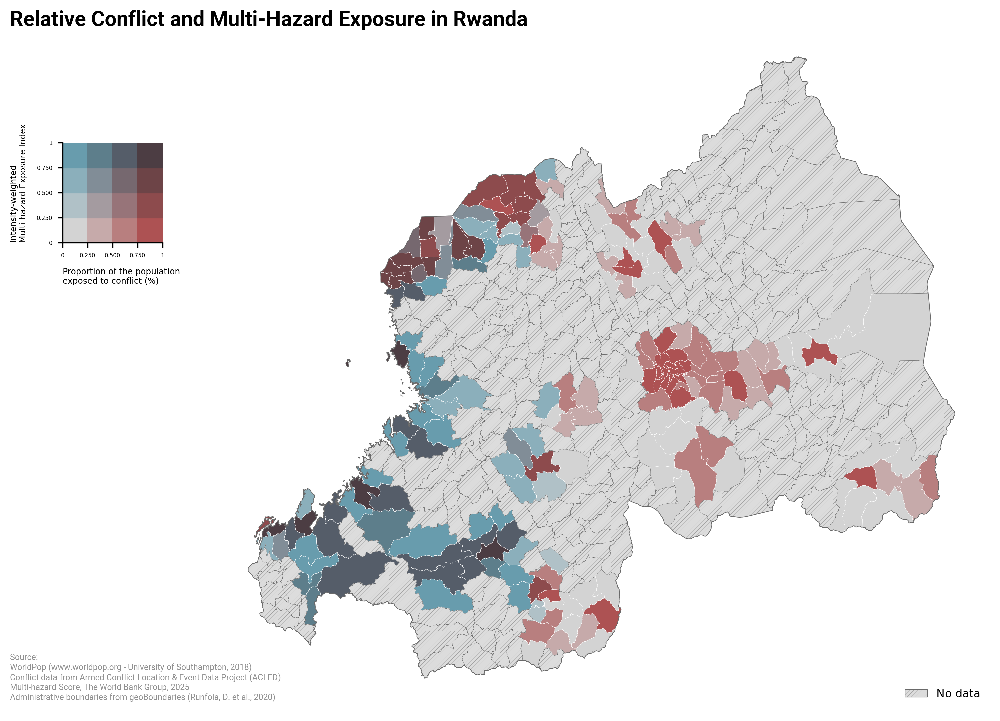

In [25]:
geoplot.plot_bivariate_choropleth( 
    var1="wbg_conflict_exposure_relative",
    var2="mhs_intensity_weighted_exposure_relative",
    var1_bounds=[0, 1],
    var2_bounds=[0, 1],
    binning="equal_intervals",
    kwargs={
        "legend_fontsize": 4, 
        "edgecolor": "white", 
        "linewidth": 0.2
    }
);

## Zoom Bivariate Choropleth to a specific region

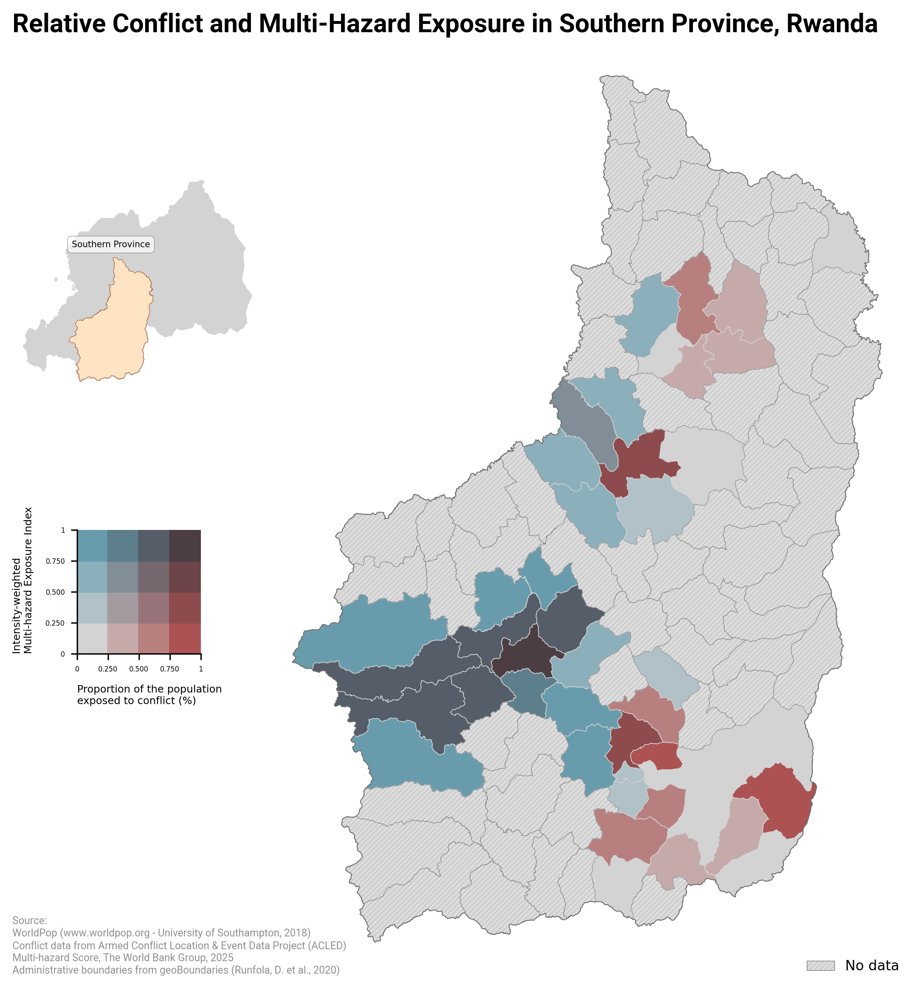

In [26]:
geoplot.plot_bivariate_choropleth( 
    var1="wbg_conflict_exposure_relative",
    var2="mhs_intensity_weighted_exposure_relative",
    var1_bounds=[0, 1],
    var2_bounds=[0, 1],
    binning="equal_intervals",
    kwargs={"legend_fontsize": 4},
    zoom_to={"ADM1": "Southern Province"},
);

## Interactive Map

In [ ]:
m = geoplot.plot_folium(
    adm_level=adm_level,
    var="mhs_wbg_conflict_exposure_relative"
)
m

In [5]:
 m.save("folium.html")